In [ ]:
!pip install ultralytics==8.3.75 

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.9/914.9 kB 24.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 53.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 29.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 33.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 56.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [ ]:
import tensorflow as tf

: 

In [1]:
from ultralytics import YOLO
from IPython.display import display, Image

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/home/server-iss-mbkm/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [2]:
model = YOLO('yolov8n.pt')  # Load a pretrained YOLOv8n model

100%|██████████| 6.25M/6.25M [00:03<00:00, 1.69MB/s]


In [3]:
model.classes = [0]  # 0 is the index for the 'person' class in YOLOv8

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving 204-9.jpg to 204-9.jpg


In [60]:
import os
#image_path = list(uploaded.keys())[0]
#image_path = '/'.join(['artifcact','test.jpeg'])
image_path = os.path.join('test.jpg')
save_path= '/'.join(['croped_object'])
image_path


'test.jpg'

In [66]:
#from ultralytics import YOLO
import cv2
import os

def crop_objects(image_path,save_path):
    # Load YOLOv8 model
    #model = YOLO('yolov8n.pt')  # menggunakan model YOLOv8 nano

    # Buat direktori untuk menyimpan hasil crop jika belum ada
    if not os.path.exists(save_path):
        os.makedirs(save_path)

    # Baca gambar
    image = cv2.imread(image_path)

    # Lakukan deteksi
    results = model(image)

    #cv2.imshow(image)
    #cv2.waitKey(0)
    #return results

    
    # Proses setiap deteksi
    for i, r in enumerate(results[0].boxes.data):
        # Ambil koordinat bounding box
        x1, y1, x2, y2, conf, cls = r
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)

        # Crop gambar
        cropped = image[y1:y2, x1:x2]


        # Dapatkan nama class
        class_name = model.names[int(cls)]
       # print(class_name);
        # Simpan gambar hasil crop
        if(class_name == "person"):
          save_name = f"{save_path}/{class_name}_{i}.jpg"
          cv2.imwrite(save_name, cropped)

          print(f"Saved {class_name} crop to {save_path}")

# Contoh penggunaan
#image_path = "path/to/your/image.jpg"


In [67]:
crop_objects(image_path,save_path)



0: 384x640 12 persons, 6 chairs, 51.8ms
Speed: 2.9ms preprocess, 51.8ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
Saved person crop to croped_object
Saved person crop to croped_object
Saved person crop to croped_object
Saved person crop to croped_object
Saved person crop to croped_object
Saved person crop to croped_object
Saved person crop to croped_object
Saved person crop to croped_object
Saved person crop to croped_object
Saved person crop to croped_object
Saved person crop to croped_object
Saved person crop to croped_object


In [ ]:
import os
from google.colab import drive

# Mount Google Drive (if needed)
drive.mount('/content/drive')

# Specify the directory containing your files
file_dir = '/content/drive/My Drive/desertasi/cropped_objects4'  # Replace with your actual directory

# Get a list of all files in the directory
file_list = [f for f in os.listdir(file_dir) if os.path.isfile(os.path.join(file_dir, f))]

# Print the file list
print("Files to be processed:")
for filename in file_list:
    print(filename)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Files to be processed:
person_9.jpg
person_27.jpg
person_26.jpg
person_1.jpg
person_28.jpg
person_11.jpg
person_13.jpg
person_7.jpg
person_8.jpg
person_18.jpg
person_4.jpg
person_15.jpg
person_21.jpg
person_3.jpg
person_0.jpg
person_12.jpg
person_2.jpg
person_20.jpg
person_16.jpg
person_17.jpg


Processing person_9.jpg...
Processing person_27.jpg...
Processing person_26.jpg...
Processing person_1.jpg...
Processing person_28.jpg...
Processing person_11.jpg...
Processing person_13.jpg...
Processing person_7.jpg...
Processing person_8.jpg...
Processing person_18.jpg...
Processing person_4.jpg...
Processing person_15.jpg...
Processing person_21.jpg...
Processing person_3.jpg...
Processing person_0.jpg...
Processing person_12.jpg...
Processing person_2.jpg...
Processing person_20.jpg...
Processing person_16.jpg...
Processing person_17.jpg...
person_9.jpg


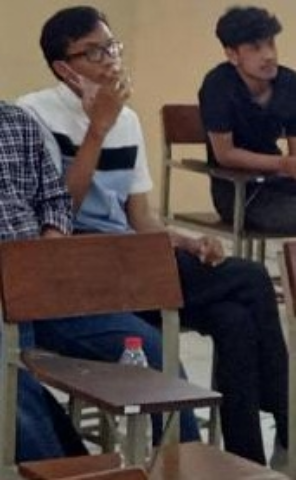

person_27.jpg


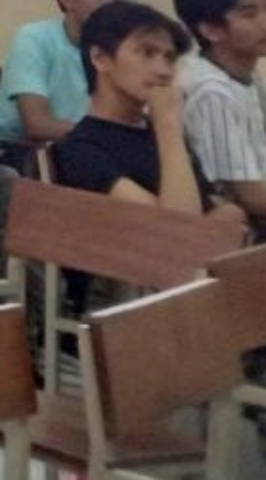

person_26.jpg


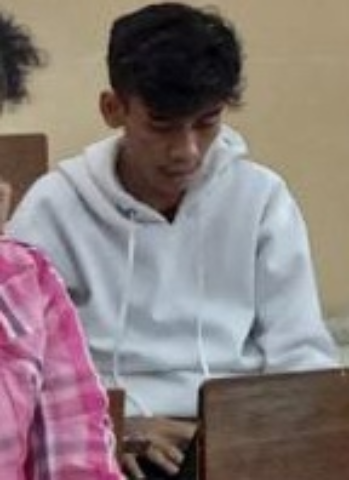

person_1.jpg


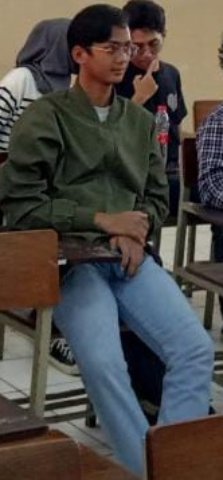

person_28.jpg


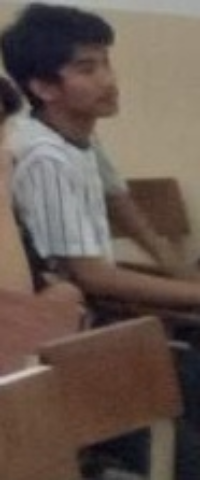

person_11.jpg


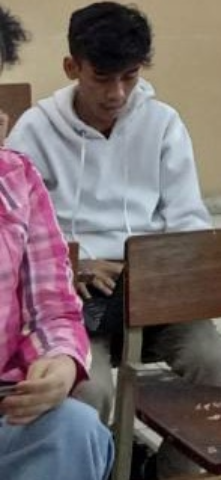

person_13.jpg


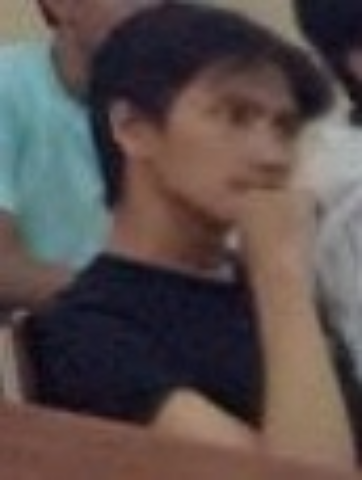

person_7.jpg


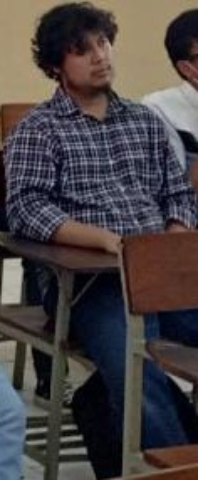

person_8.jpg


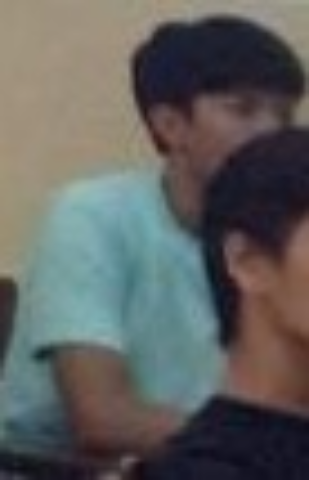

person_18.jpg


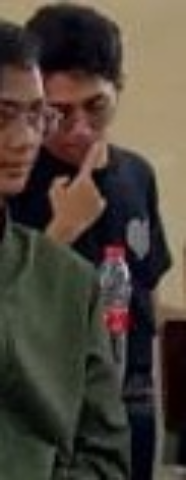

person_4.jpg


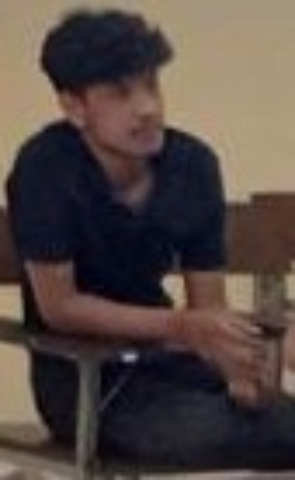

person_15.jpg


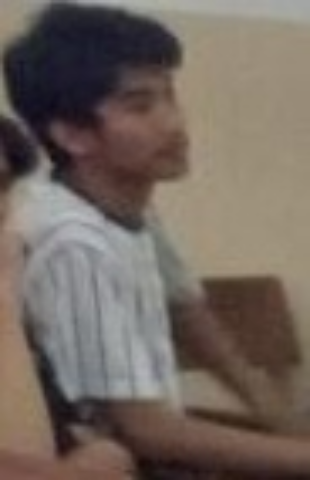

person_21.jpg


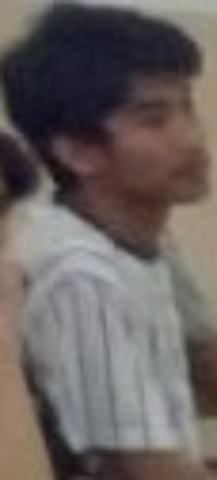

person_3.jpg


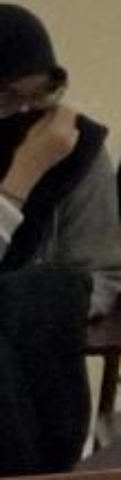

person_0.jpg


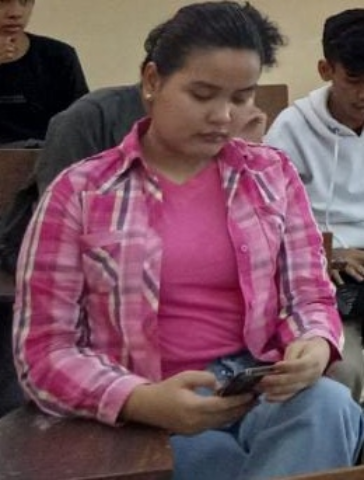

person_12.jpg


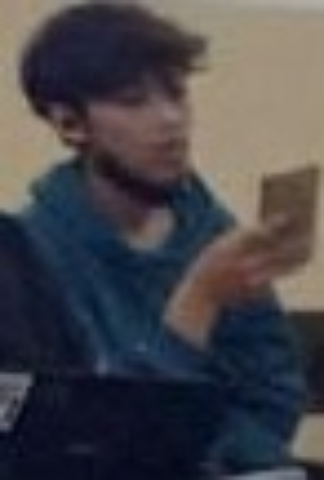

person_2.jpg


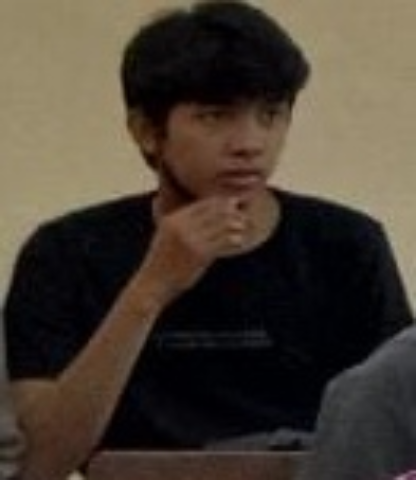

person_20.jpg


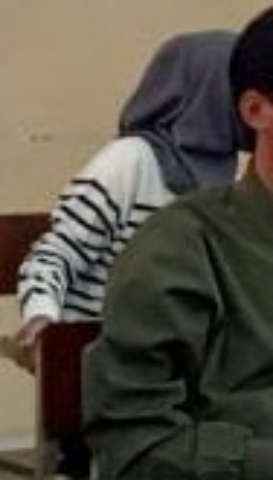

person_16.jpg


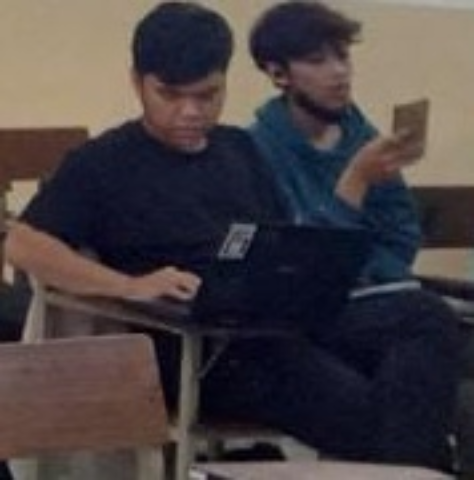

person_17.jpg


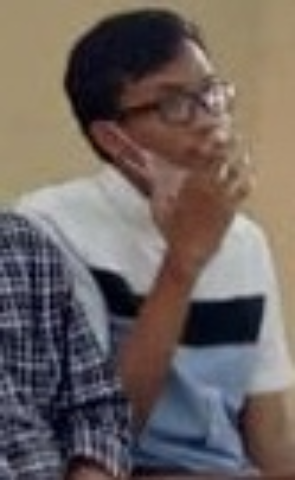

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import math
import numpy as np

DESIRED_HEIGHT = 480
DESIRED_WIDTH = 480


def resize_and_show(image):
    h, w = image.shape[:2]
    if h < w:
        img = cv2.resize(image, (DESIRED_WIDTH, math.floor(h / (w / DESIRED_WIDTH))))
    else:
        img = cv2.resize(image, (math.floor(w / (h / DESIRED_HEIGHT)), DESIRED_HEIGHT))
    cv2_imshow(img)


# Create an empty dictionary to store images
images = {}

for filename in file_list:
    file_path = os.path.join(file_dir, filename)
    print(f"Processing {filename}...")
    # Read images with OpenCV and store in the dictionary
    image = cv2.imread(file_path)  # Read the image using file_path
    if image is not None:  # Check if image was loaded successfully
        images[filename] = image  # Store image in the dictionary
    else:
        print(f"Could not load image: {file_path}")

# Preview the images.
for name, image in images.items():
    print(name)
    resize_and_show(image)

In [ ]:
!pip install deepface

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 7.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 36.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 35.0 MB/s eta 0:00:00
  Created wheel for fire: filename=fire-0.7.0-py3-none-any.whl size=114249 sha256=b2414fbd7663fc29b9f0b91c0bca6d12466a6ae899e43a9f8bf8b5b4eeaf4b4f
  Stored in directory: /root/.cache/pip/wheels/46/54/24/1624fd5b8674eb1188623f7e8e17cdf7c0f6c24b609dfb8a89
Successfully built fire


25-01-09 03:43:30 - Directory /root/.deepface has been created
25-01-09 03:43:30 - Directory /root/.deepface/weights has been created
25-01-09 03:43:34 - facenet_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/facenet_weights.h5
To: /root/.deepface/weights/facenet_weights.h5
100%|██████████| 92.2M/92.2M [00:00<00:00, 208MB/s]


25-01-09 03:43:35 - target_size: (160, 160)
25-01-09 03:43:38 - Euclidean distance: 11.05096700582338
25-01-09 03:43:38 - Threshold for Facenet-euclidean pair is 10
25-01-09 03:43:38 - This pair is different persons because its distance 11.05096700582338 is greater than threshold 10


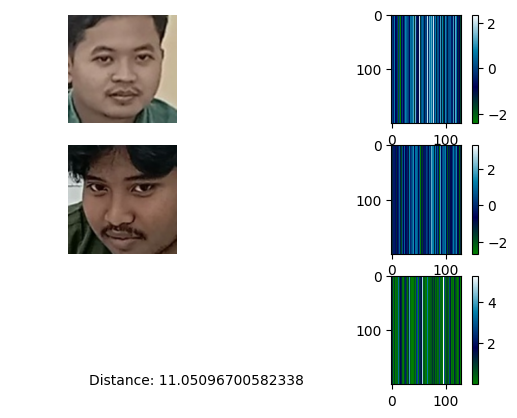

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

# project dependencies
from deepface import DeepFace
from deepface.modules import verification
from deepface.models.FacialRecognition import FacialRecognition
from deepface.commons.logger import Logger

logger = Logger()

# ----------------------------------------------
# build face recognition model

#model_name = "VGG-Face"
model_name = "Facenet"

model: FacialRecognition = DeepFace.build_model(task="facial_recognition", model_name=model_name)

target_size = model.input_shape

logger.info(f"target_size: {target_size}")

# ----------------------------------------------
# load images and find embeddings

img1 = DeepFace.extract_faces(img_path="cropped_objects4/person_1.jpg")[0]["face"]
img1 = cv2.resize(img1, target_size)
img1 = np.expand_dims(img1, axis=0)  # to (1, 224, 224, 3)
img1_representation = model.forward(img1)

img2 = DeepFace.extract_faces(img_path="cropped_objects4/person_2.jpg")[0]["face"]
img2 = cv2.resize(img2, target_size)
img2 = np.expand_dims(img2, axis=0)
img2_representation = model.forward(img2)

img1_representation = np.array(img1_representation)
img2_representation = np.array(img2_representation)

# ----------------------------------------------
# distance between two images - euclidean distance formula
distance_vector = np.square(img1_representation - img2_representation)
current_distance = np.sqrt(distance_vector.sum())
logger.info(f"Euclidean distance: {current_distance}")

threshold = verification.find_threshold(model_name=model_name, distance_metric="euclidean")
logger.info(f"Threshold for {model_name}-euclidean pair is {threshold}")

if current_distance < threshold:
    logger.info(
        f"This pair is same person because its distance {current_distance}"
        f" is less than threshold {threshold}"
    )
else:
    logger.info(
        f"This pair is different persons because its distance {current_distance}"
        f" is greater than threshold {threshold}"
    )
# ----------------------------------------------
# expand vectors to be shown better in graph

img1_graph = []
img2_graph = []
distance_graph = []

for i in range(0, 200):
    img1_graph.append(img1_representation)
    img2_graph.append(img2_representation)
    distance_graph.append(distance_vector)

img1_graph = np.array(img1_graph)
img2_graph = np.array(img2_graph)
distance_graph = np.array(distance_graph)

# ----------------------------------------------
# plotting

fig = plt.figure()

ax1 = fig.add_subplot(3, 2, 1)
plt.imshow(img1[0])
plt.axis("off")

ax2 = fig.add_subplot(3, 2, 2)
im = plt.imshow(img1_graph, interpolation="nearest", cmap=plt.cm.ocean)
plt.colorbar()

ax3 = fig.add_subplot(3, 2, 3)
plt.imshow(img2[0])
plt.axis("off")

ax4 = fig.add_subplot(3, 2, 4)
im = plt.imshow(img2_graph, interpolation="nearest", cmap=plt.cm.ocean)
plt.colorbar()

ax5 = fig.add_subplot(3, 2, 5)
plt.text(0.35, 0, f"Distance: {current_distance}")
plt.axis("off")

ax6 = fig.add_subplot(3, 2, 6)
im = plt.imshow(distance_graph, interpolation="nearest", cmap=plt.cm.ocean)
plt.colorbar()

plt.show()

In [ ]:
!pip install mediapipe

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.6/35.6 MB 30.4 MB/s eta 0:00:00


In [ ]:
import mediapipe as mp
mp_pose = mp.solutions.pose
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles

help(mp_pose.Pose)

Help on class Pose in module mediapipe.python.solutions.pose:

class Pose(mediapipe.python.solution_base.SolutionBase)
 |  Pose(static_image_mode=False, model_complexity=1, smooth_landmarks=True, enable_segmentation=False, smooth_segmentation=True, min_detection_confidence=0.5, min_tracking_confidence=0.5)
 |  
 |  MediaPipe Pose.
 |  
 |  MediaPipe Pose processes an RGB image and returns pose landmarks on the most
 |  prominent person detected.
 |  
 |  Please refer to https://solutions.mediapipe.dev/pose#python-solution-api for
 |  usage examples.
 |  
 |  Method resolution order:
 |      Pose
 |      mediapipe.python.solution_base.SolutionBase
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __init__(self, static_image_mode=False, model_complexity=1, smooth_landmarks=True, enable_segmentation=False, smooth_segmentation=True, min_detection_confidence=0.5, min_tracking_confidence=0.5)
 |      Initializes a MediaPipe Pose object.
 |      
 |      Args:
 |        static_i

Nose coordinates: (265.0651163458824, 123.40934658050537)
Pose landmarks of person_0.jpg:


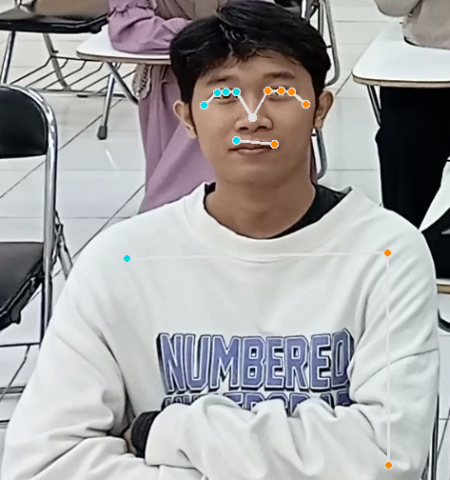

Nose coordinates: (181.48848116397858, 99.43550390005112)
Pose landmarks of person_1.jpg:


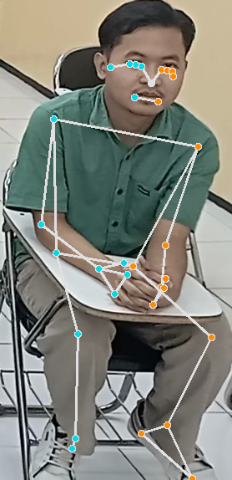

Nose coordinates: (141.84192311763763, 190.30466079711914)
Pose landmarks of person_2.jpg:


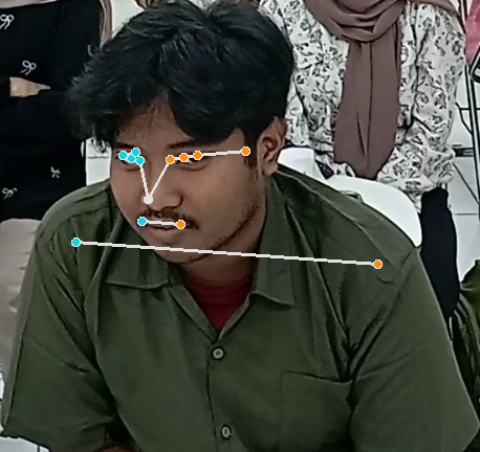

Nose coordinates: (135.01298904418945, 84.27678978443146)
Pose landmarks of person_3.jpg:


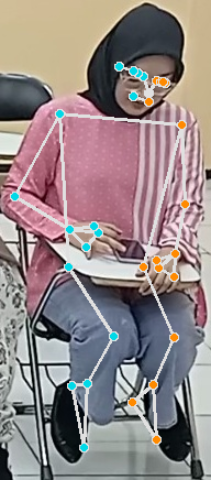

Nose coordinates: (161.62560141086578, 78.51865863800049)
Pose landmarks of person_4.jpg:


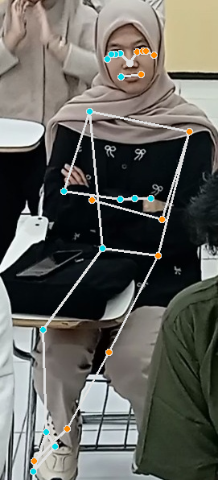

Nose coordinates: (96.99906241893768, 68.48417550325394)
Pose landmarks of person_5.jpg:


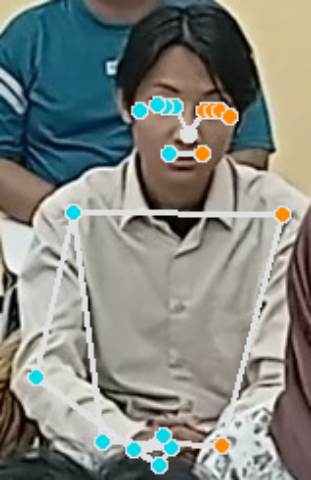

Nose coordinates: (114.51240062713623, 153.06527084112167)
Pose landmarks of person_6.jpg:


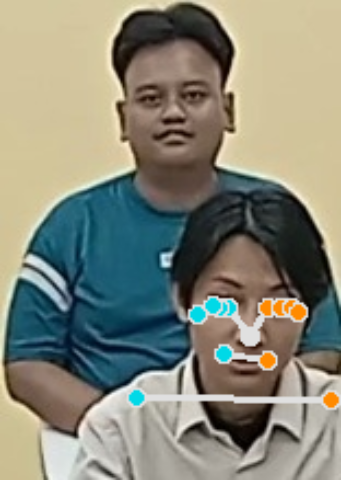

Nose coordinates: (91.53571486473083, 60.48419326543808)
Pose landmarks of person_7.jpg:


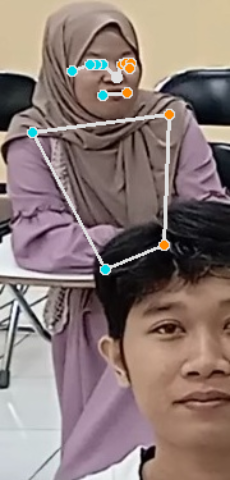

Nose coordinates: (102.78082102537155, 53.539124488830566)
Pose landmarks of person_8.jpg:


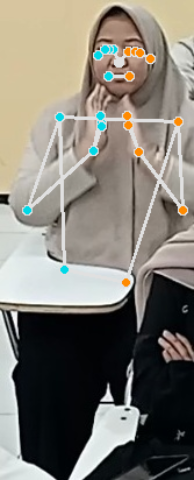

Nose coordinates: (62.841572642326355, 43.96360184252262)
Pose landmarks of person_9.jpg:


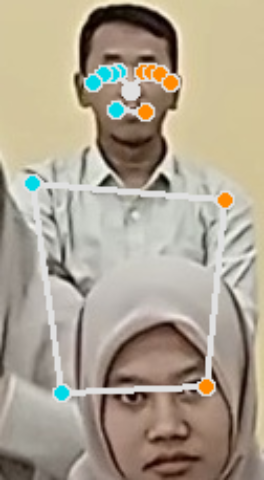

Nose coordinates: (76.48236083984375, 81.27729991078377)
Pose landmarks of person_11.jpg:


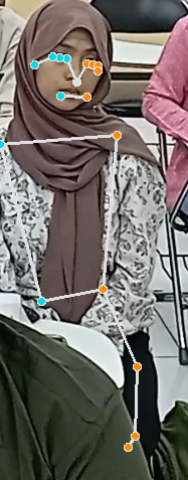

Nose coordinates: (160.52983993291855, 68.41329139471054)
Pose landmarks of person_13.jpg:


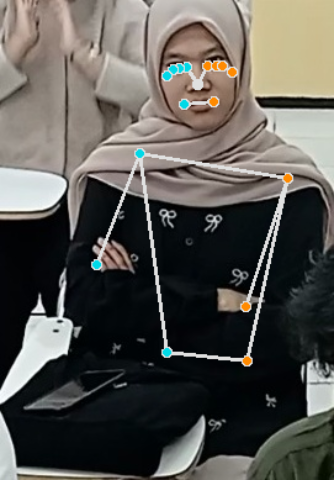

In [ ]:
# Run MediaPipe Pose and draw pose landmarks.
with mp_pose.Pose(
    static_image_mode=True, min_detection_confidence=0.5, model_complexity=2) as pose:
  for name, image in images.items():
    # Convert the BGR image to RGB and process it with MediaPipe Pose.
    results = pose.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    # Print nose landmark.
    image_hight, image_width, _ = image.shape
    if not results.pose_landmarks:
      continue
    print(
      f'Nose coordinates: ('
      f'{results.pose_landmarks.landmark[mp_pose.PoseLandmark.NOSE].x * image_width}, '
      f'{results.pose_landmarks.landmark[mp_pose.PoseLandmark.NOSE].y * image_hight})'
    )

    # Draw pose landmarks.
    print(f'Pose landmarks of {name}:')
    annotated_image = image.copy()
    mp_drawing.draw_landmarks(
        annotated_image,
        results.pose_landmarks,
        mp_pose.POSE_CONNECTIONS,
        landmark_drawing_spec=mp_drawing_styles.get_default_pose_landmarks_style())
    save_dir = '/content/drive/My Drive/pose_objects'
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    save_path = f"{save_dir}/{name}"
    cv2.imwrite(save_path, annotated_image) # Fixed indentation
    resize_and_show(annotated_image)

In [ ]:
# Run MediaPipe Pose and draw pose landmarks.
with mp_pose.Pose(
    static_image_mode=True, min_detection_confidence=0.5, model_complexity=2) as pose:
  for name, image in images.items():
    # Convert the BGR image to RGB and process it with MediaPipe Pose.
    results = pose.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    # Print nose landmark.
    image_hight, image_width, _ = image.shape
    if not results.pose_landmarks:
      continue
    print(
      f'Nose coordinates: ('
      f'{results.pose_landmarks.landmark[mp_pose.PoseLandmark.NOSE].x * image_width}, '
      f'{results.pose_landmarks.landmark[mp_pose.PoseLandmark.NOSE].y * image_hight})'
    )

    # Draw pose landmarks.
    print(f'Pose landmarks of {name}:')
    annotated_image = image.copy()
    mp_drawing.draw_landmarks(
        annotated_image,
        results.pose_landmarks,
        mp_pose.POSE_CONNECTIONS,
        landmark_drawing_spec=mp_drawing_styles.get_default_pose_landmarks_style())
    resize_and_show(annotated_image)

IndentationError: unexpected indent (<ipython-input-14-cb2e4f23acfd>, line 28)

Nose world landmark:
x: -0.0476626
y: -0.430389792
z: -0.448269874
visibility: 0.99859637



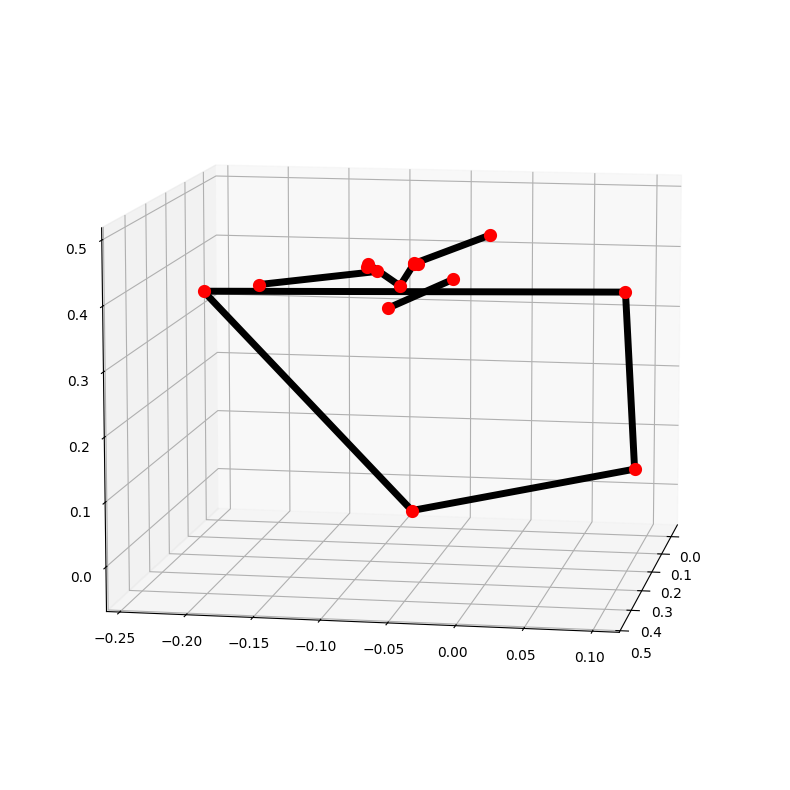

Nose world landmark:
x: 2.31936574e-05
y: -0.500099719
z: -0.450595289
visibility: 0.999627352



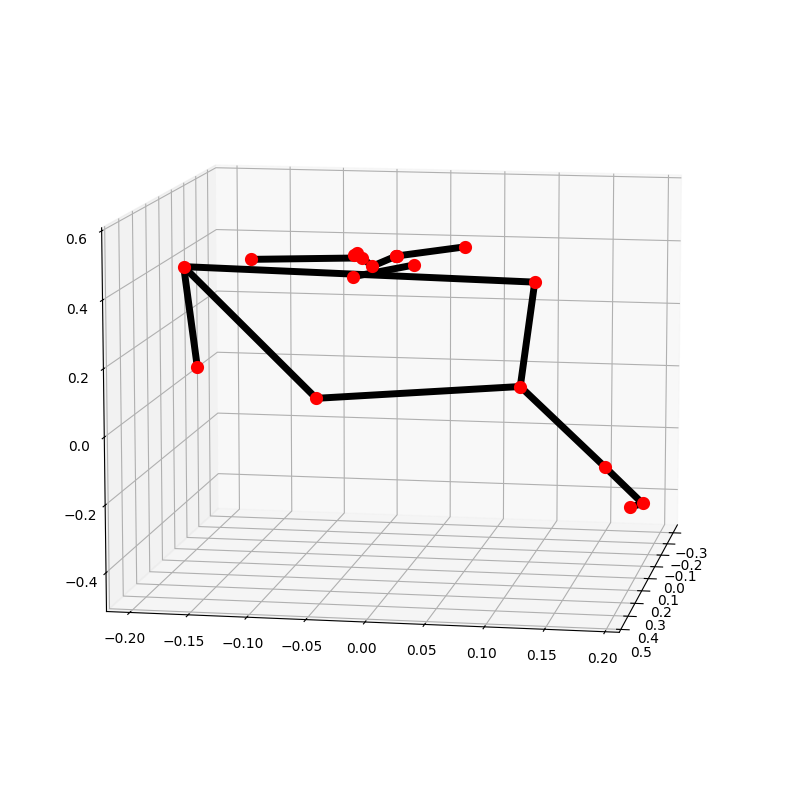

Nose world landmark:
x: 0.058051616
y: -0.569139361
z: -0.260134488
visibility: 0.997999



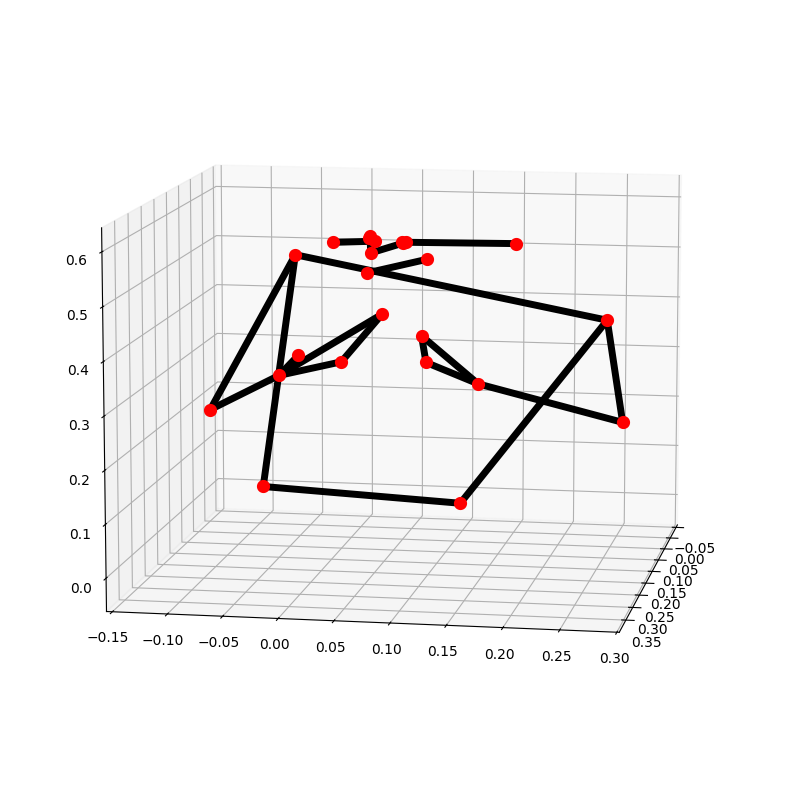

Nose world landmark:
x: 0.0296216086
y: -0.465769053
z: -0.489747882
visibility: 0.999458969



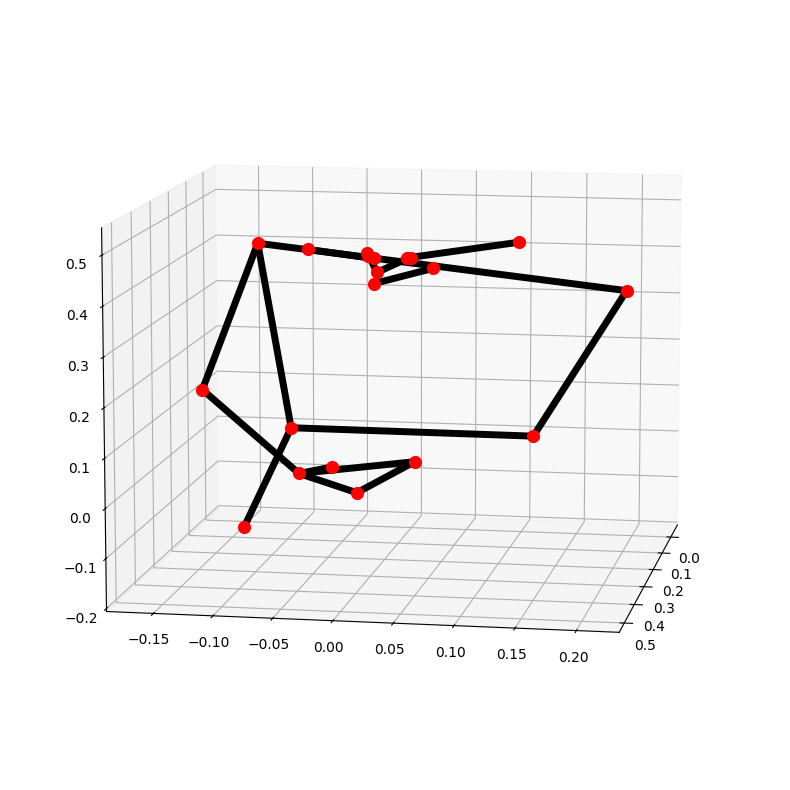

Nose world landmark:
x: -0.16504851
y: -0.344352752
z: -0.582925558
visibility: 0.999904156



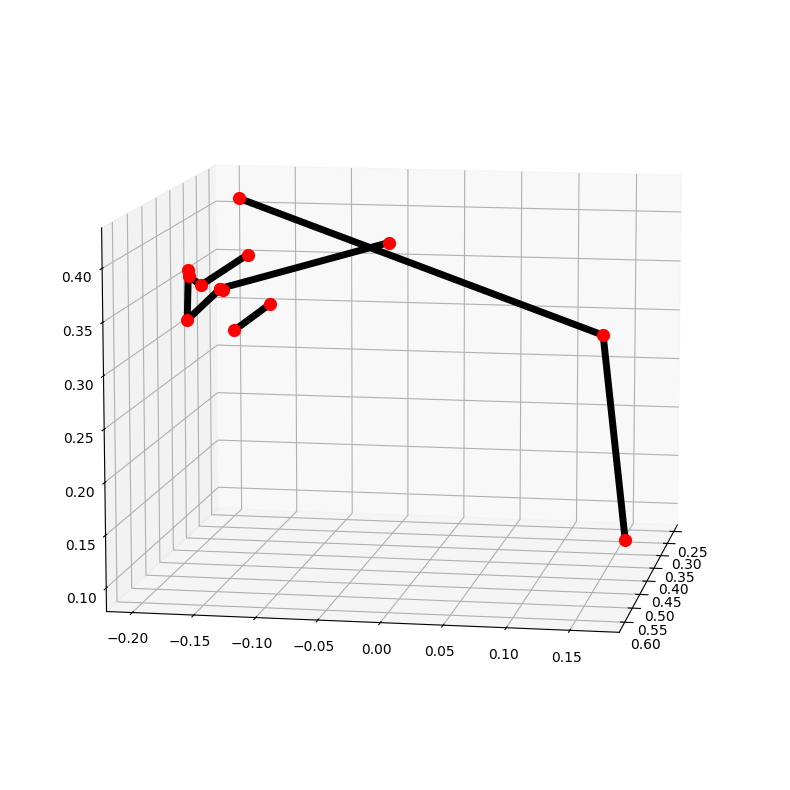

Nose world landmark:
x: 0.13941735
y: -0.408908725
z: -0.502108455
visibility: 0.999645



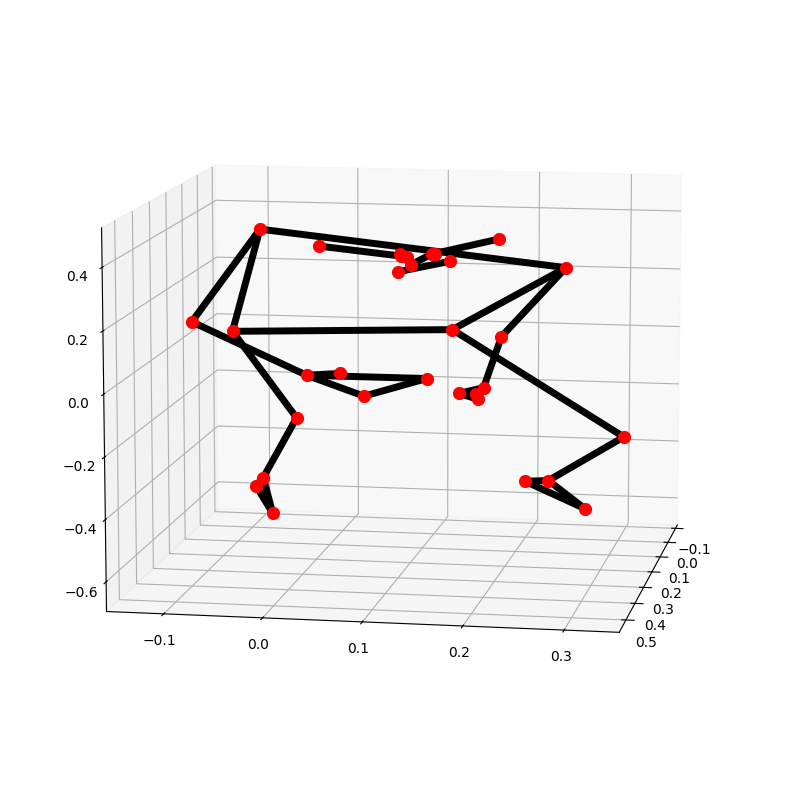

Nose world landmark:
x: -0.0179697908
y: -0.528144479
z: -0.382554144
visibility: 0.999991536



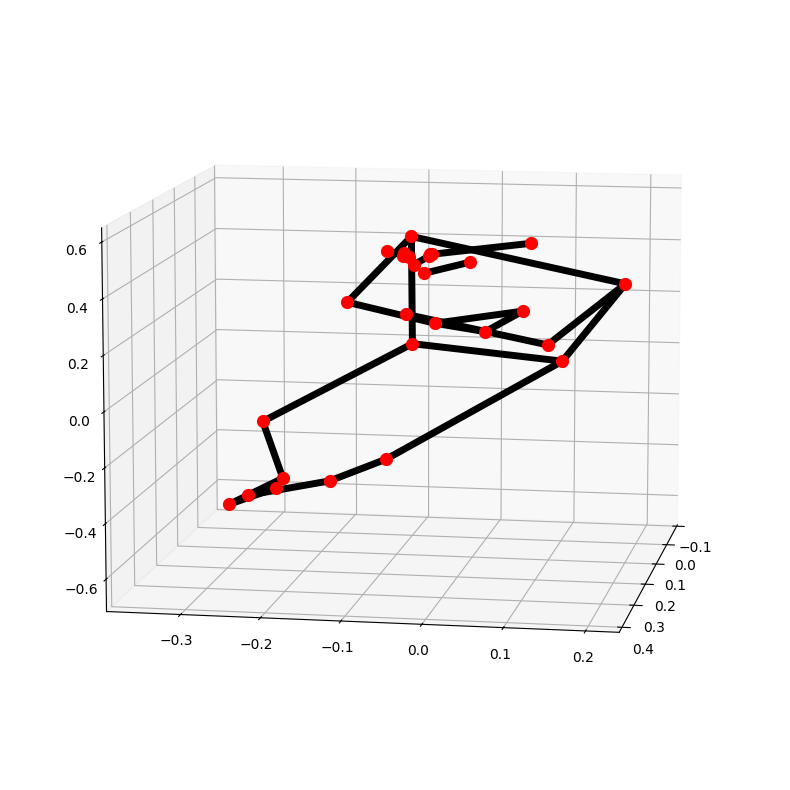

Nose world landmark:
x: 0.10565614
y: -0.437589914
z: -0.424021333
visibility: 0.998850346



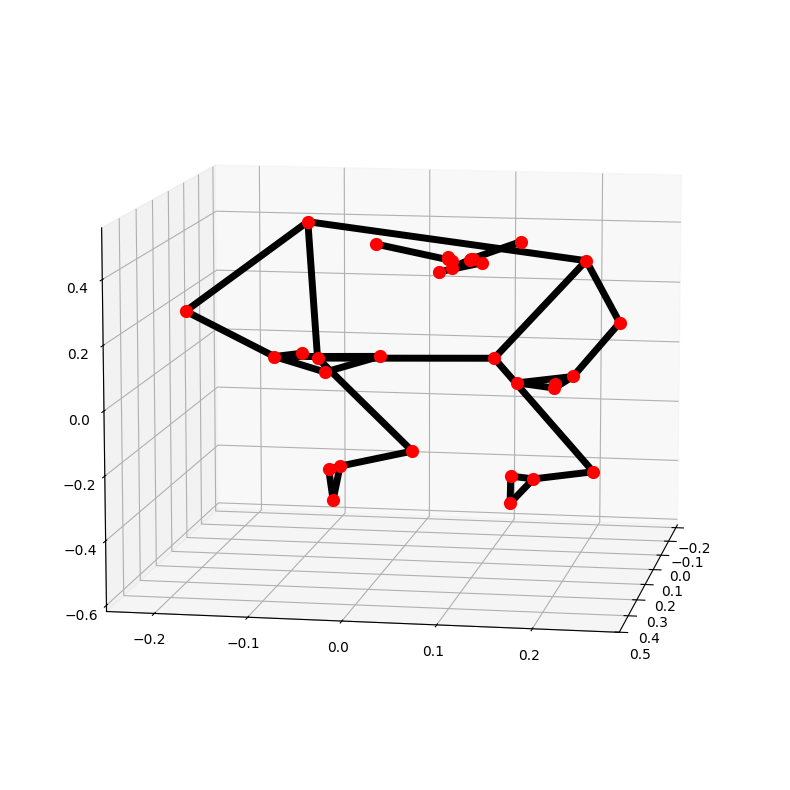

Nose world landmark:
x: -0.0322943032
y: -0.540722907
z: -0.325001478
visibility: 0.99996829



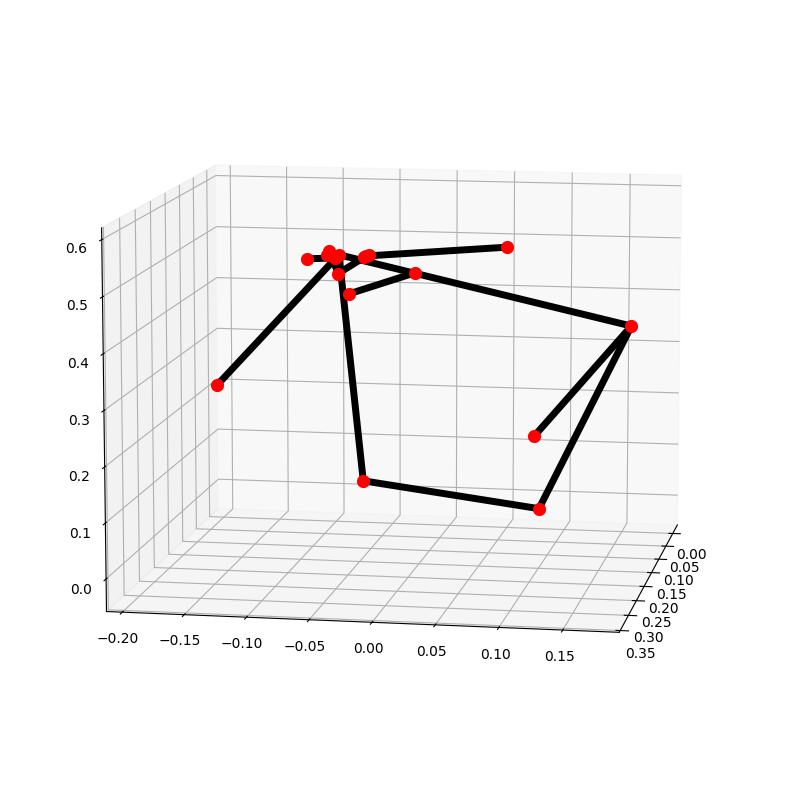

Nose world landmark:
x: 0.0319259912
y: -0.394321084
z: -0.534233153
visibility: 0.876132965



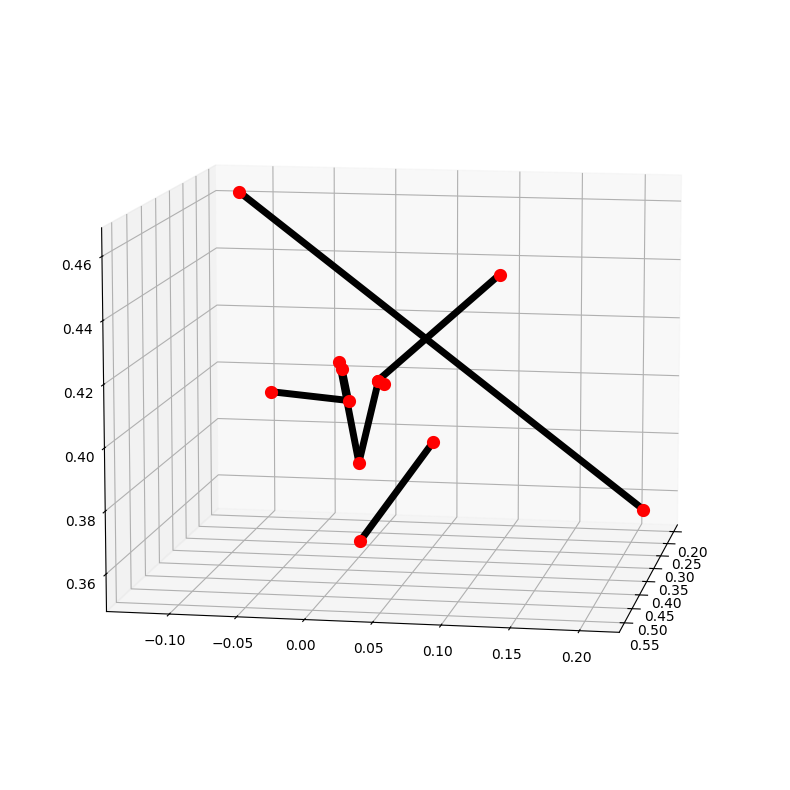

Nose world landmark:
x: 0.00423733704
y: -0.560696483
z: -0.348769128
visibility: 0.993050933



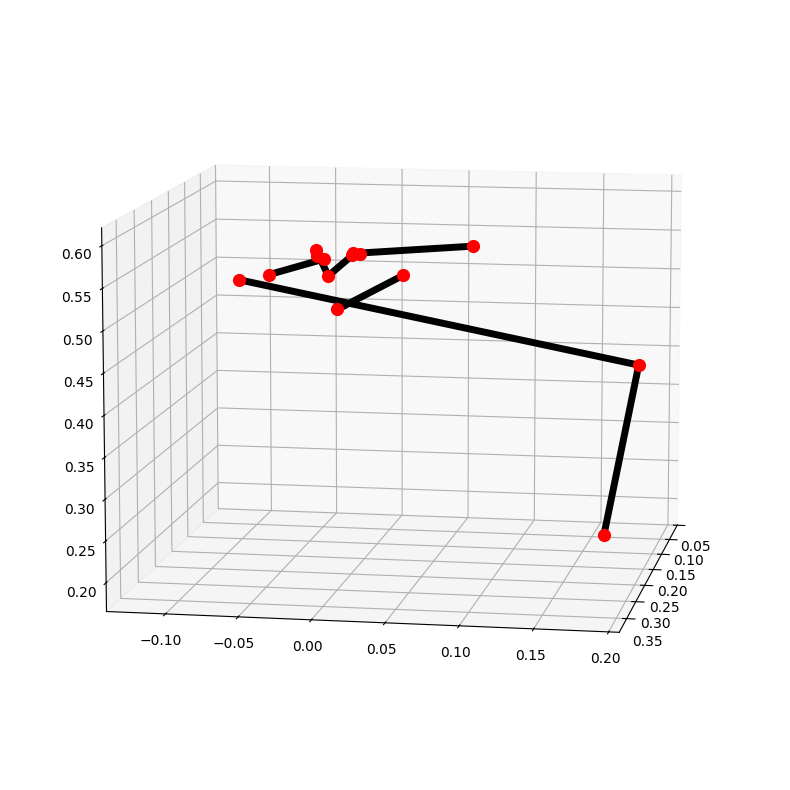

Nose world landmark:
x: 0.0111326873
y: -0.519865394
z: -0.352715433
visibility: 0.994773209



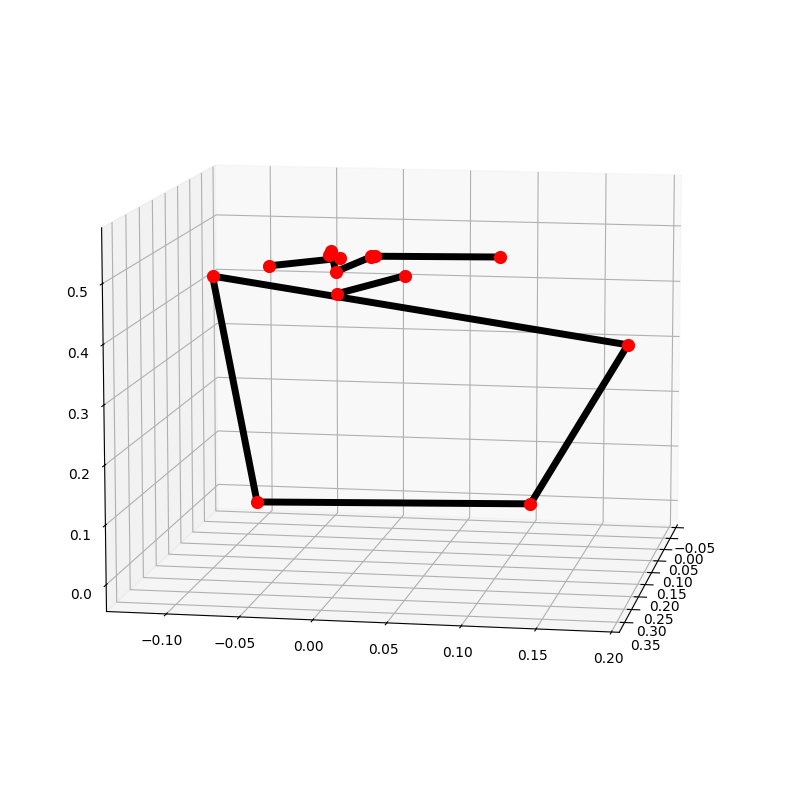

In [ ]:
# Run MediaPipe Pose and plot 3d pose world landmarks.
with mp_pose.Pose(
    static_image_mode=True, min_detection_confidence=0.5, model_complexity=2) as pose:
  for name, image in images.items():
    results = pose.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    # Print the real-world 3D coordinates of nose in meters with the origin at
    # the center between hips.
    print('Nose world landmark:'),
    print(results.pose_world_landmarks.landmark[mp_pose.PoseLandmark.NOSE])

    # Plot pose world landmarks.
    mp_drawing.plot_landmarks(
        results.pose_world_landmarks, mp_pose.POSE_CONNECTIONS)

Pose segmentation of person_7.jpg:


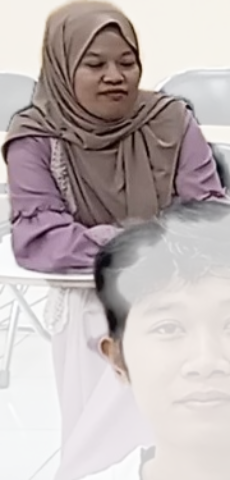

Pose segmentation of person_11.jpg:


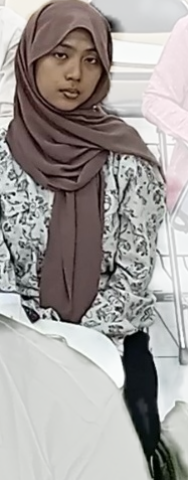

Pose segmentation of person_8.jpg:


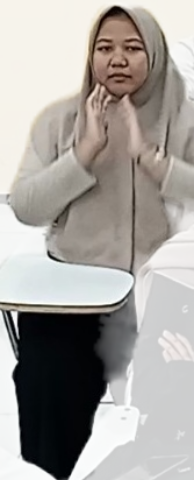

Pose segmentation of person_5.jpg:


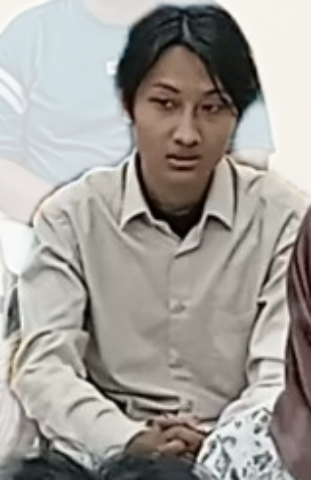

Pose segmentation of person_2.jpg:


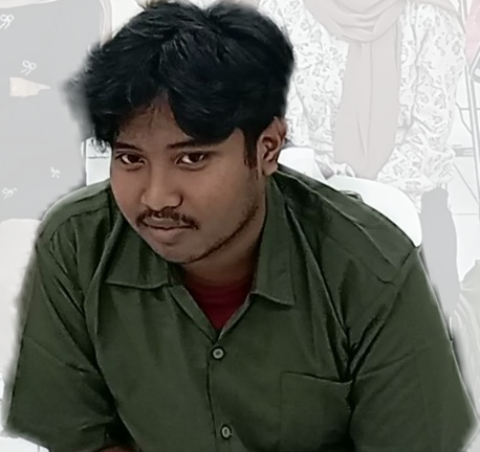

Pose segmentation of person_1.jpg:


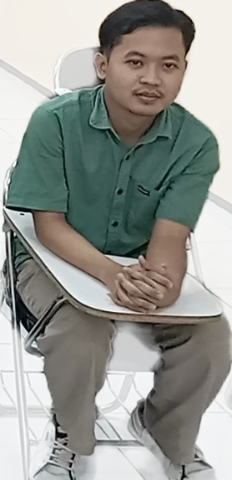

Pose segmentation of person_4.jpg:


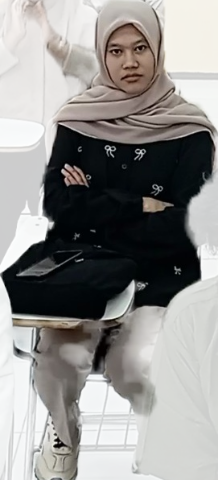

Pose segmentation of person_3.jpg:


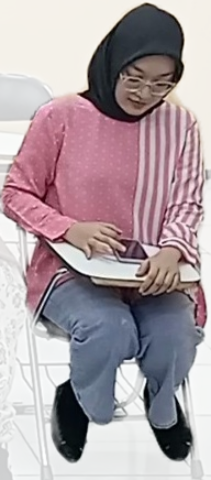

Pose segmentation of person_13.jpg:


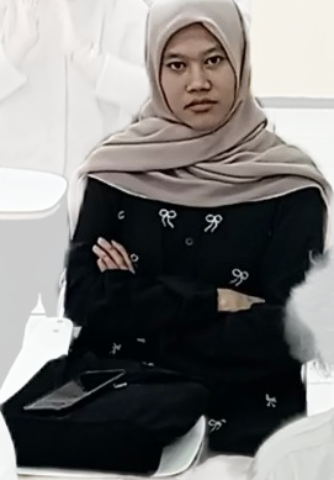

Pose segmentation of person_6.jpg:


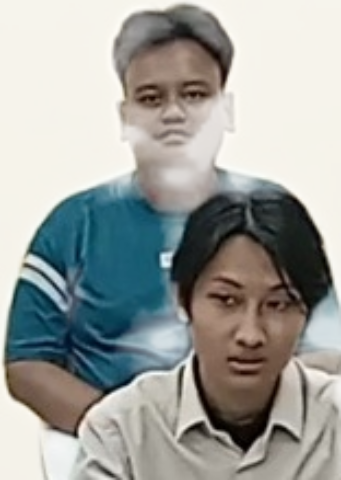

Pose segmentation of person_0.jpg:


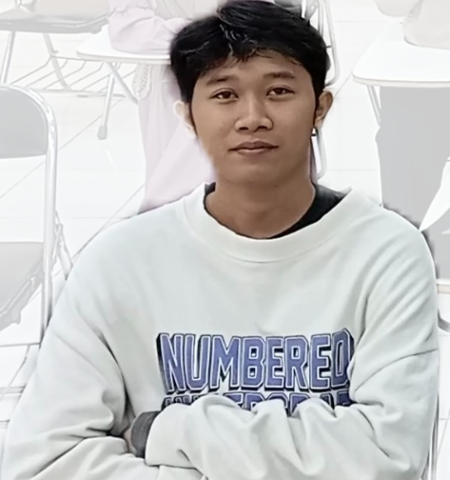

Pose segmentation of person_9.jpg:


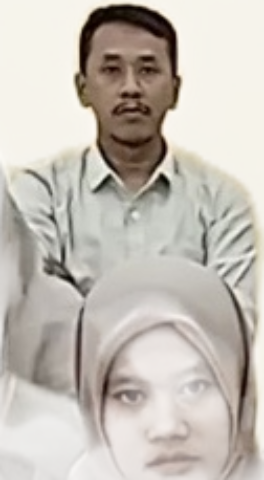

In [ ]:
# Run MediaPipe Pose with `enable_segmentation=True` to get pose segmentation.
with mp_pose.Pose(
    static_image_mode=True, min_detection_confidence=0.5,
    model_complexity=2, enable_segmentation=True) as pose:
  for name, image in images.items():
    results = pose.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    # Draw pose segmentation.
    print(f'Pose segmentation of {name}:')
    annotated_image = image.copy()
    red_img = np.zeros_like(annotated_image, dtype=np.uint8)
    red_img[:, :] = (255,255,255)
    segm_2class = 0.2 + 0.8 * results.segmentation_mask
    segm_2class = np.repeat(segm_2class[..., np.newaxis], 3, axis=2)
    annotated_image = annotated_image * segm_2class + red_img * (1 - segm_2class)
    resize_and_show(annotated_image)